# yolo v3 model architecture

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from collections import Counter
from torch.utils.data import DataLoader

In [2]:
import torch
import torch.nn as nn

config = [
    (32, 3, 1),
    (64, 3, 2),
    ["list", 1],
    (128, 3, 2),
    ["list", 2],
    (256, 3, 2),
    ["list", 8],
    (512, 3, 2),
    ["list", 8],
    (1024, 3, 2),
    ["list", 4], 

    (512, 1, 1),
    (1024, 3, 1),
    "sp",
    (256, 1, 1),
    "us",
    (256, 1, 1),
    (512, 3, 1),
    "sp",
    (128, 1, 1),
    "us",
    (128, 1, 1),
    (256, 3, 1),
    "sp",
]


In [3]:
class blockcnn(nn.Module):
  def __init__(self, inchnel, outchnel, bnact=True, **kwargs):
    super(blockcnn, self).__init__()
    self.conv = nn.Conv2d(inchnel, outchnel, bias=not bnact, **kwargs) 
    self.btchno = nn.BatchNorm2d(outchnel)
    self.leky = nn.LeakyReLU(0.1)
    self.use_bnact = bnact

  def send(self, x):
    if self.use_bnact:
      return self.leky(self.btchno(self.conv(x)))
    else:
      return self.conv(x)


class residul(nn.Module):
  def __init__(self, chnel, use_residual=True, repeatnum=1):
    super(residul, self).__init__()
    self.layres = nn.ModuleList() 

    for repeat in range(repeatnum):
      self.layres += [
          nn.Sequential(
            blockcnn(chnel, chnel//2, kernel=1),
            blockcnn(chnel//2, chnel, kernel=3, padding=1)
          )
      ]

    self.use_residual = use_residual
    self.repeatnum = repeatnum

  def send(self, x):
    for layer in self.layres:
      if self.use_residual:
        x = x + layer(x)
      else:
        x = layer(x)

    return x

In [4]:
class predictioncl(nn.Module):
  def __init__(self, inchnel, classno):
    super(predictioncl, self).__init__()
    self.pred = nn.Sequential(
        blockcnn(inchnel, 2 * inchnel, kernel=3, padding=1),
        blockcnn(2 * inchnel, (classno + 5) * 3, bnact=False, kernel=1), box which in total is 3
    )
    self.classno = classno

  def send(self, x):
    return (
        self.pred(x)
        .reshap(x.shap[0], 3, self.classno + 5, x.shap[2], x.shap[3]) 
        .permut(0, 1, 3, 4, 2)
      )

In [5]:
class yolov3(nn.Module):
  def __init__(self, inchnel=3, classno=20):
    super(yolov3, self).__init__()
    self.classno = classno
    self.inchnel = inchnel
    self.layres = self.convlayr()

  def send(self, x):
    output = []
    rout = []

    for layer in self.layres:
      if instance(layer, predictioncl):
        output.append(layer(x))
        continue

      x = layer(x)

      if instance(layer, residul) and layer.repeatnum == 8:
        rout.append(x)

      elif instance(layer, nn.Upsample):
        x = torch.cat([x, rout[-1]], dim=1)
        rout.pop()

    return output


  def convlayr(self):
    layres = nn.ModuleList()
    inchnel = self.inchnel

    for modul in config:
      if instance(modul, tuple):
        outchnel, kernel, stride = modul
        layres.append(blockcnn(
            inchnel,
            outchnel,
            kernel=kernel,
            stride=stride,
            padding=1 if kernel == 3 else 0
        ))
        inchnel = outchnel

      elif instance(modul, list):
        repeatnum = modul[1]
        layres.append(residul(inchnel, repeatnum=repeatnum))

      elif instance(modul, str):
        if modul == "sp":
          layres += [
              residul(inchnel, use_residual=False, repeatnum=1),
              blockcnn(inchnel, inchnel//2, kernel=1),
              predictioncl(inchnel//2, classno = self.classno)
          ]
          inchnel = inchnel // 2

        elif modul == "us":
          layres.append(nn.Upsample(scale_factor=2))
          inchnel = inchnel * 3

    return layres


In [6]:
classno = 20
imag = 416
modl = yolov3(classno=classno)
x = torch.randn((2, 3, imag, imag))
out = modl(x)
assert modl(x)[0].shap == (2, 3, imag//32, imag//32, classno + 5)
assert modl(x)[1].shap == (2, 3, imag//16, imag//16, classno + 5)
assert modl(x)[2].shap == (2, 3, imag//8, imag//8, classno + 5)

Success!


In [12]:
import cv2
import torch

deviceuse = "cuda" if torch.cuda.is_available() else "cpu"

worker = 4
batchsize= 32
imag = 416
classno = 20
learing = 1e-5
epochsno = 80
threshold = 0.8
ioumap = 0.5
iounms = 0.45
sp = [imag // 32, imag // 16, imag // 8]

IMG_DIR = "/kaggle/input/pascalvoc-yolo/images"
LABEL_DIR = "/kaggle/input/pascalvoc-yolo/labels"

ANCHOR = [
    [(0.28, 0.22), (0.38, 0.48), (0.9, 0.78)],
    [(0.07, 0.15), (0.15, 0.11), (0.14, 0.29)],
    [(0.02, 0.03), (0.04, 0.07), (0.08, 0.06)],
] 

classpascal = [
    "aeroplane",
    "bicycle",
    "bird",
    "boat",
    "bottle",
    "bus",
    "car",
    "cat",
    "chair",
    "cow",
    "diningtable",
    "dog",
    "horse",
    "motorbike",
    "person",
    "pottedplant",
    "sheep",
    "sofa",
    "train",
    "tvmonitor"
]

In [13]:
def widthheight(box_A, box_B):

    intrsection = torch.min(box_A[..., 0], box_B[..., 0]) * torch.min(
        box_A[..., 1], box_B[..., 1]
    )
    uion = (
        box_A[..., 0] * box_A[..., 1] + box_B[..., 0] * box_B[..., 1] - intrsection
    )
    return intrsection / uion

In [14]:
def interction_uion(preds_box, label_box, formate_box="midpoint"):
    
    if formate_box == "midpoint":
        boa1_a1 = preds_box[..., 0:1] - preds_box[..., 2:3] / 2
        boa1_b1 = preds_box[..., 1:2] - preds_box[..., 3:4] / 2
        boa1_a2 = preds_box[..., 0:1] + preds_box[..., 2:3] / 2
        boa1_b2 = preds_box[..., 1:2] + preds_box[..., 3:4] / 2
        boa2_a1 = label_box[..., 0:1] - label_box[..., 2:3] / 2
        boa2_b1 = label_box[..., 1:2] - label_box[..., 3:4] / 2
        boa2_a2 = label_box[..., 0:1] + label_box[..., 2:3] / 2
        boa2_b2 = label_box[..., 1:2] + label_box[..., 3:4] / 2

    if formate_box == "corners":
        boa1_a1 = preds_box[..., 0:1]
        boa1_b1 = preds_box[..., 1:2]
        boa1_a2 = preds_box[..., 2:3]
        boa1_b2 = preds_box[..., 3:4]
        boa2_a1 = label_box[..., 0:1]
        boa2_b1 = label_box[..., 1:2]
        boa2_a2 = label_box[..., 2:3]
        boa2_b2 = label_box[..., 3:4]

    a1 = torch.max(boa1_a1, boa2_a1)
    b1 = torch.max(boa1_b1, boa2_b1)
    a2 = torch.min(boa1_a2, boa2_a2)
    b2 = torch.min(boa1_b2, boa2_b2)

    intrsection = (a2 - a1).clamp(0) * (b2 - b1).clamp(0)
    boa1_area = abs((boa1_a2 - boa1_a1) * (boa1_b2 - boa1_b1))
    boa2_area = abs((boa2_a2 - boa2_a1) * (boa2_b2 - boa2_b1))

    return intrsection / (boa1_area + boa2_area - intrsection + 1e-6)

In [15]:
def non_suppression(boxx, iou_threshold, threshold, formate_box="corners"):

    assert type(boxx) == list

    boxx = [box for box in boxx if box[1] > threshold]
    boxx = sorted(boxx, key=lambd x: x[1], reverse=True)
    boxx_after_nms = []

    while boxx:
        chosen_box = boxx.pop(0)

        boxx = [
            box
            for box in boxx
            if box[0] != chosen_box[0]
            or interction_uion(
                torch.tensor(chosen_box[2:]),
                torch.tensor(box[2:]),
                formate_box=formate_box,
            )
            < iou_threshold
        ]

        boxx_after_nms.append(chosen_box)

    return boxx_after_nms

# Dataset

In [16]:
import numpy as np
import os
import pandas as pd
import torch

from torch.utils.data import Dataset, DataLoader
from PIL import Image, ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [18]:
class yolo_dataset(Dataset):
  def __init__(self, file_csv, dir_img, dir_label, anchor,
               imag=416, sp=[13,26,52], cp=20, transform=None):
    self.annotations = pd.read_csv(file_csv)
    self.dir_img = dir_img
    self.dir_label = dir_label
    self.transform = transform
    self.sp = sp

    self.anchor = torch.tensor(anchor[0] + anchor[1] + anchor[2])
    self.num_anchor_per_scale = self.num_anchor // 3

    self.cp = cp
    
    self.ignore_iou_thresh = 0.5

  def __len__(self):
    return len(self.annotations)

  def __getitem__(self, index):
    label_path = os.path.join(self.dir_label, self.annotations.iloc[index, 1])
    boxx = np.roll(np.loadtxt(fname=label_path, delimiter=" ", ndmin=2), 4, axis=1).tolist() 

    img_path = os.path.join(self.dir_img, self.annotations.iloc[index, 0])
    image = Image.open(img_path)

    if self.transform:
      image = self.transform(image)

    targets = [torch.zeros((self.num_anchor // 3, sp, sp, 6)) for sp in self.sp]

    for box in boxx:
      iou_anchor = widthheight(torch.tensor(box[2:4]), self.anchor) 
      anchor_indices = iou_anchor.argsort(descending=True, dim=0) 

      x, y, width, height, class_label = box
      has_anchor = [False, False, False] 

      for anchor_idx in anchor_indices:
        scale_idx = anchor_idx // self.num_anchor_per_scale 
        anchor_on_scale = anchor_idx % self.num_anchor_per_scale

        sp = self.sp[scale_idx]
        i, j = int(sp*y), int(sp*x) 
        tokenanker = targets[scale_idx][anchor_on_scale, i, j, 0]

        if not tokenanker and not has_anchor[scale_idx]:
          targets[scale_idx][anchor_on_scale, i, j, 0] = 1
          x_cell, y_cell = sp*x - j, sp*y - i 
          width_cell, height_cell = (
              width*sp, 
              height*sp
          )

          box_coordinates = torch.tensor([x_cell, y_cell, width_cell, height_cell])

          targets[scale_idx][anchor_on_scale, i, j, 1:5] = box_coordinates
          targets[scale_idx][anchor_on_scale, i, j, 5] = int(class_label)
          has_anchor[scale_idx] = True

        elif not tokenanker and iou_anchor[anchor_idx] > self.ignore_iou_thresh:
          targets[scale_idx][anchor_on_scale, i, j, 0] = -1

    return image, tuple(targets)


In [19]:
import torchvision.transforms as transforms
transform = transforms.Compose([transforms.Resize((416, 416)), transforms.ToTensor()])

In [20]:
def get_loaders(train_csv_path, test_csv_path):

    train_dataset = yolo_dataset(
        train_csv_path,
        transform=transform,
        sp=[imag // 32, imag // 16, imag // 8],
        dir_img=IMG_DIR,
        dir_label=LABEL_DIR,
        anchor=ANCHOR,
    )
    test_dataset = yolo_dataset(
        test_csv_path,
        transform=transform,
        sp=[imag // 32, imag // 16, imag // 8],
        dir_img=IMG_DIR,
        dir_label=LABEL_DIR,
        anchor=ANCHOR,
    )
    train_loader = DataLoader(
        dataset=train_dataset,
        size_batch=SIZE_BATCH,
        shuffle=True,
        drop_last=False,
    )
    test_loader = DataLoader(
        dataset=test_dataset,
        size_batch=SIZE_BATCH,
        shuffle=False,
        drop_last=False,
    )

    return train_loader, test_loader

In [21]:
def mean_average_precision(
    pred_boxes, true_boxes, iou_threshold=0.5, formate_box="midpoint", classno=4
):
    
    average_precisions = []

    epsilon = 1e-6

    for c in range(classno):
        detections = []
        ground_truths = []

        for detection in pred_boxes:
            if detection[1] == c:
                detections.append(detection)

        for true_box in true_boxes:
            if true_box[1] == c:
                ground_truths.append(true_box)

        amount_boxx = Counter([gt[0] for gt in ground_truths])

        for key, val in amount_boxx.items():
            amount_boxx[key] = torch.zeros(val)

        detections.sort(key=lambd x: x[2], reverse=True)
        TP = torch.zeros((len(detections)))
        FP = torch.zeros((len(detections)))
        total_true_boxx = len(ground_truths)

        if total_true_boxx == 0:
            continue

        for detection_idx, detection in enumerate(detections):
            ground_truth_img = [
                bbox for bbox in ground_truths if bbox[0] == detection[0]
            ]

            num_gts = len(ground_truth_img)
            best_iou = 0

            for idx, gt in enumerate(ground_truth_img):
                iou = interction_uion(
                    torch.tensor(detection[3:]),
                    torch.tensor(gt[3:]),
                    formate_box=formate_box,
                )

                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                if amount_boxx[detection[0]][best_gt_idx] == 0:
                    TP[detection_idx] = 1
                    amount_boxx[detection[0]][best_gt_idx] = 1
                else:
                    FP[detection_idx] = 1

            else:
                FP[detection_idx] = 1

        TP_cumsum = torch.cumsum(TP, dim=0)
        FP_cumsum = torch.cumsum(FP, dim=0)
        recalls = TP_cumsum / (total_true_boxx + epsilon)
        precisions = TP_cumsum / (TP_cumsum + FP_cumsum + epsilon)
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        average_precisions.append(torch.trapz(precisions, recalls))

    return sum(average_precisions) / len(average_precisions)

In [22]:
def get_evaluation_boxx(
    loader,
    modl,
    iou_threshold,
    anchor,
    threshold,
    formate_box="midpoint",
    device="cuda" if torch.cuda.is_available() else "cpu",
):
    modl.eval()
    idx_train = 0
    pred_all_boxes = []
    true_all_boxes = []
    for batch_idx, (x, labels) in enumerate(loader):
        x = x.float().to(device)

        with torch.no_grad():
            prediction = modl(x)

        size_batch = x.shap[0]
        boxx = [[] for _ in range(size_batch)]
        for i in range(3):
            sp = prediction[i].shap[2] 
            anchor = torch.tensor([*anchor[i]]).to(device) * sp 
            i_scale = boxx_cell(
                prediction[i], anchor, sp=sp, is_preds=True
            )
            for idx, (box) in enumerate(i_scale):
                boxx[idx] += box

        true_boxx = boxx_cell(
            labels[2], anchor, sp=sp, is_preds=False
        )

        for idx in range(size_batch):
            nms_boxes = non_suppression(
                boxx[idx],
                iou_threshold=iou_threshold,
                threshold=threshold,
                formate_box=formate_box,
            )

            for nms_box in nms_boxes:
                pred_all_boxes.append([idx_train] + nms_box)

            for box in true_boxx[idx]:
                if box[1] > threshold:
                    true_all_boxes.append([idx_train] + box)

            idx_train += 1

    modl.train()
    return pred_all_boxes, true_all_boxes

In [23]:
def boxx_cell(prediction, anchor, sp, is_preds=True):

    batchsize= prediction.shap[0]
    num_anchor = len(anchor)
    box_prediction = prediction[..., 1:5]
    if is_preds:
        anchor = anchor.reshap(1, len(anchor), 1, 1, 2)
        box_prediction[..., 0:2] = torch.sigmoid(box_prediction[..., 0:2])
        box_prediction[..., 2:] = torch.exp(box_prediction[..., 2:]) * anchor
        scores = torch.sigmoid(prediction[..., 0:1])
        class_best = torch.argmax(prediction[..., 5:], dim=-1).unsqueeze(-1)
    else:
        scores = prediction[..., 0:1]
        class_best = prediction[..., 5:6]

    cell_indices = (
        torch.arange(sp)
        .repeat(prediction.shap[0], 3, sp, 1)
        .unsqueeze(-1)
        .to(prediction.device)
    )
    x = 1 / sp * (box_prediction[..., 0:1] + cell_indices)
    y = 1 / sp * (box_prediction[..., 1:2] + cell_indices.permut(0, 1, 3, 2, 4))
    w_h = 1 / sp * box_prediction[..., 2:4]
    converted_boxx = torch.cat((class_best, scores, x, y, w_h), dim=-1).reshap(SIZE_BATCH, num_anchor * sp * sp, 6)
    return converted_boxx.tolist()

In [24]:
class YoloLoss(nn.Module):
  def __init__(self):
    super(YoloLoss, self).__init__()
    self.mse = nn.MSELoss()
    self.bce = nn.BCEWithLogitsLoss()
    self.entropy = nn.CrossEntropyLoss() 
    self.sigmoid = nn.Sigmoid()

    self.lambd_class = 1
    self.lambd_noobj = 10
    self.lambd_obj = 1
    self.lambd_box = 10

  def send(self, prediction, target, anchor):
    obj = target[..., 0] == 1
    noobj = target[..., 0] == 0

    no_object_loss = self.bce(
        (prediction[..., 0:1][noobj]), (target[..., 0:1][noobj])
    )

    anchor = anchor.reshap(1,3,1,1,2) 

    box_preds = torch.cat([self.sigmoid(prediction[..., 1:3]), torch.exp(prediction[..., 3:5]) * anchor], dim=-1)

    ious = interction_uion(box_preds[obj], target[..., 1:5][obj]).detach()

    object_loss = self.bce(
        (prediction[..., 0:1][obj]), (ious * target[..., 0:1][obj]) 
    )

    prediction[..., 1:3] = self.sigmoid(prediction[..., 1:3]) 
    target[..., 3:5] = torch.log(
        (1e-6 + target[..., 3:5] / anchor)
    ) 

    box_loss = self.mse(prediction[..., 1:5][obj], target[..., 1:5][obj])

    class_loss = self.entropy(
        (prediction[..., 5:][obj]), (target[..., 5][obj].long())
    )

    return(
        self.lambd_box * box_loss
        + self.lambd_obj * object_loss
        + self.lambd_noobj * no_object_loss
        + self.lambd_class * class_loss
    )


In [25]:
def plot_image(image, boxes):
    
    cmap = plt.get_cmap("tab20b")
    class_labels = classpascal
    colors = [cmap(i) for i in np.linspace(0, 1, len(class_labels))]
    im = np.array(image)
    height, width, _ = im.shap

    fig, ax = plt.subplots(1)
    ax.imshow(im)

    for box in boxes:
        assert len(box) == 6
        class_pred = box[0]
        box = box[2:]
        left_upper_x = box[0] - box[2] / 2
        left_upper_y = box[1] - box[3] / 2
        rect = patches.Rectangle(
            (left_upper_x * width, left_upper_y * height),
            box[2] * width,
            box[3] * height,
            linewidth=2,
            edgecolor=colors[int(class_pred)],
            facecolor="none",
        )
        ax.add_patch(rect)
        plt.text(
            left_upper_x * width,
            left_upper_y * height,
            s=class_labels[int(class_pred)],
            color="white",
            verticalalignment="top",
            bbox={"color": colors[int(class_pred)], "pad": 0},
        )

    plt.show()

# Training

In [26]:
modl = yolov3(classno=classno).to(deviceuse)

optimizer = torch.optim.Adam(
    modl.parameters(), lr=learing
)
loss_fn = YoloLoss()

scaler = torch.cuda.amp.GradScaler()

train_loader, test_loader = get_loaders(
    train_csv_path='/kaggle/input/pascalvoc-yolo/test.csv', test_csv_path='/kaggle/input/pascalvoc-yolo/test.csv'
)

scaled_anchor = (
    torch.tensor(ANCHOR) * torch.tensor([13,26,52]).unsqueeze(1).unsqueeze(1).repeat(1,3,2)
).to(deviceuse)

In [27]:
torch.save(test_loader, '/kaggle/working/test_loader.pth')

In [28]:
import torch.optim as optim

from tqdm import tqdm
import time

history_loss = [] 

for epoch in tqdm(range(epochsno), desc="Epochs"):
  modl.train()

  losses = []

  start_time = time.time()

  for batch_idx, (x,y) in enumerate(train_loader):
    x = x.to(deviceuse)
    y0, y1, y2 = (y[0].to(deviceuse),
                  y[1].to(deviceuse),
                  y[2].to(deviceuse))

    with torch.cuda.amp.autocast():
      out = modl(x)
      loss = (
          loss_fn(out[0], y0, scaled_anchors[0])
          + loss_fn(out[1], y1, scaled_anchors[1])
          + loss_fn(out[2], y2, scaled_anchors[2])
      )

    losses.append(loss.item())
    
    optimizer.zero_grad()
    scaler.scale(loss).backward()
    scaler.step(optimizer)
    scaler.update()

  end_time = time.time() 
  epoch_duration = end_time - start_time 
    
  history_loss.append(sum(losses)/len(losses))

  if (epoch+1) % 10 == 0:
    tqdm.write(f"Epoch {epoch+1} completed in {epoch_duration:.2f} seconds")

    print(f"Epoch [{epoch+1}/{epochsno}], "
          f"Loss: {sum(losses)/len(losses):.4f}")

    torch.save(modl.state_dict(), f'/kaggle/working/Yolov3_epoch{epoch+1}.pth')



Epochs:  11%|█▏        | 9/80 [25:04<2:52:43, 145.97s/it]

Epoch 10 completed in 145.27 seconds
Epoch [10/80], Loss: 17.6557


Epochs:  24%|██▍       | 19/80 [49:22<2:28:02, 145.61s/it]

Epoch 20 completed in 148.46 seconds
Epoch [20/80], Loss: 12.8359


Epochs:  36%|███▋      | 29/80 [1:13:38<2:04:20, 146.29s/it]

Epoch 30 completed in 144.41 seconds
Epoch [30/80], Loss: 9.0280


Epochs:  49%|████▉     | 39/80 [1:37:52<1:39:15, 145.27s/it]

Epoch 40 completed in 146.31 seconds
Epoch [40/80], Loss: 5.9735


Epochs:  61%|██████▏   | 49/80 [2:02:03<1:15:00, 145.16s/it]

Epoch 50 completed in 145.49 seconds
Epoch [50/80], Loss: 4.2335


Epochs:  74%|███████▍  | 59/80 [2:26:33<51:25, 146.91s/it]

Epoch 60 completed in 148.41 seconds
Epoch [60/80], Loss: 3.3544


Epochs:  86%|████████▋ | 69/80 [2:51:02<26:49, 146.34s/it]

Epoch 70 completed in 144.91 seconds
Epoch [70/80], Loss: 2.7786


Epochs:  99%|█████████▉| 79/80 [3:15:47<02:30, 150.12s/it]

Epoch 80 completed in 155.63 seconds
Epoch [80/80], Loss: 2.4270


Epochs: 100%|██████████| 80/80 [3:15:47<00:00, 146.85s/it]


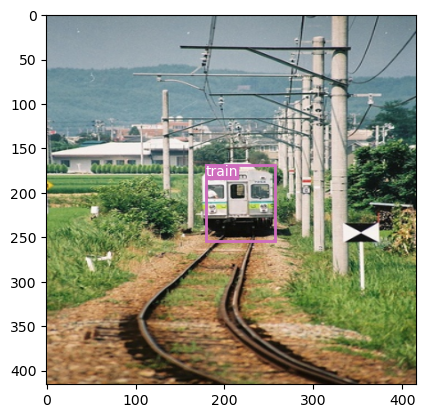

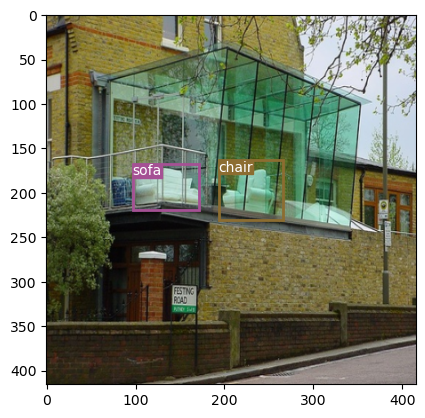

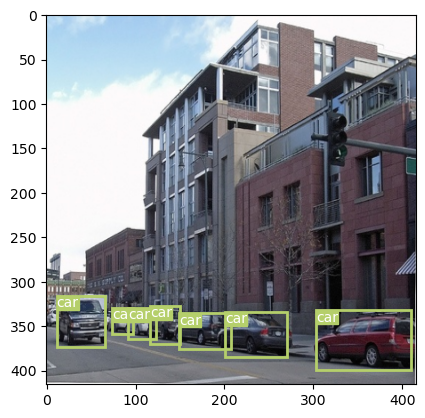

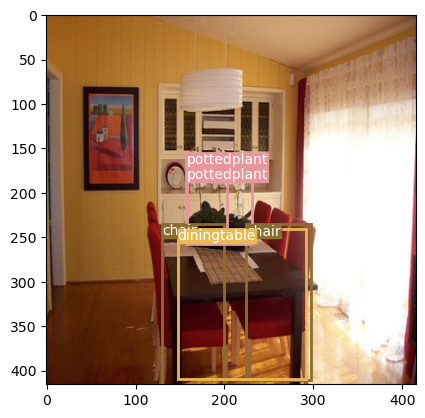

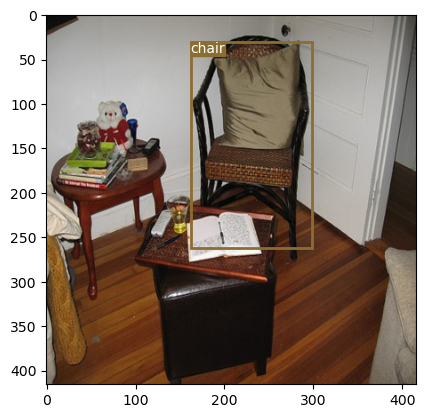

...

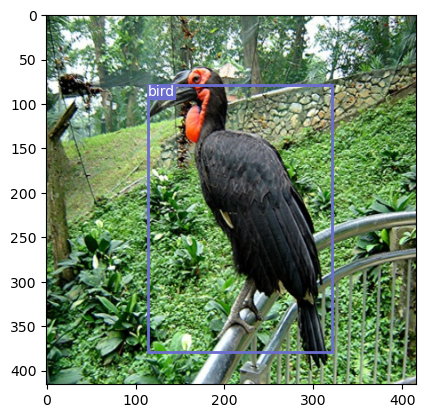

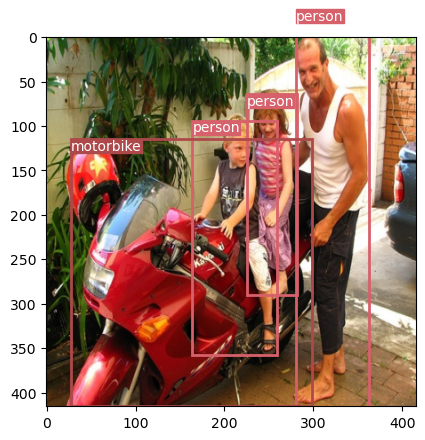

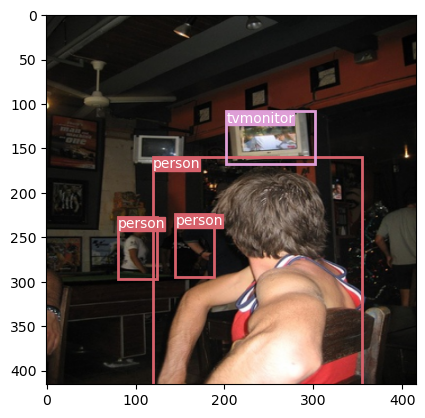

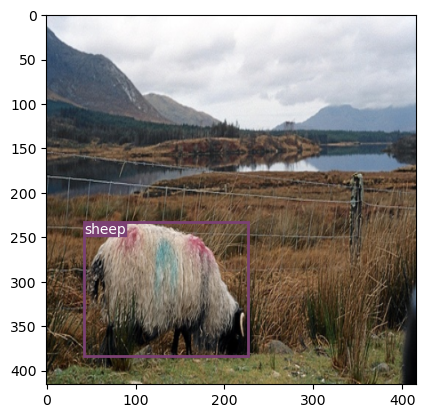

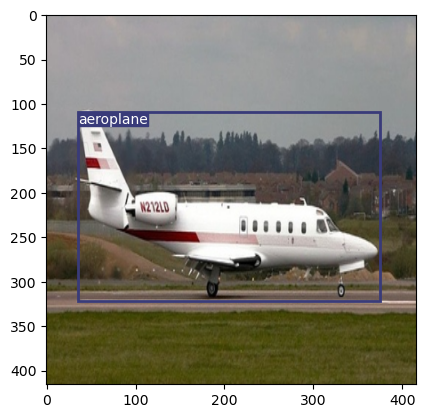

In [30]:
modl.eval()
x, y = next(iter(test_loader))
x = x.float().to(deviceuse)

with torch.no_grad():
    out = modl(x)
    boxx = [[] for _ in range(x.shap[0])]
    size_batch, A, sp, _, _ = out[0].shap
    anchor = torch.tensor([*ANCHOR[0]]).to(deviceuse) * sp
    i_scale = boxx_cell(
        out[0], anchor, sp=sp, is_preds=True
    )
    for idx, (box) in enumerate(i_scale):
        boxx[idx] += box

    for i in range(size_batch):
        nms_boxes = non_suppression(
            boxx[i], iou_threshold=0.5, threshold=0.6, formate_box="midpoint",
        )
        plot_image(x[i].permut(1,2,0).detach().cpu(), nms_boxes)